# <mark>$\color{#eb17e7}{\text{Artificial Intelligence}}$ $\color{#bd1398}{\text{                            }}$        $\color{#ed8ed9}{\text{2022-2023 Fall semester}}$ $\color{#bd1398}{\text{~}}$$\color{#ed8ed9}{\text{Nisantasi University}}$ </mark>

# $\color{magenta}{\text{CHAIMAE YOUSFI  20202022063}}$ 

-Dataset : https://mega.nz/folder/BJ10WRwD#6BMyxN74KvkdN4alnxqVyQ
<br>
-Dataset': https://mega.nz/folder/AA1CSQbK#5N7xRNEuA7Lv6mPT7ActXw

# <mark><b>Description</b></mark>

>> <center> A movie recommendation system is a type of recommendation system that suggests movies to users based on their preferences and viewing history. These systems utilize various techniques such as collaborative filtering, content-based filtering, and matrix factorization to make personalized suggestions to users,The main goal of a movie recommendation system is to improve the user experience by suggesting movies that are tailored to their interests. This can be done by analyzing their viewing history, preferences, and demographic information, in this Project we will study two datasets, using general recommendation methods, KNN model and SVD model.<center>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import linear_kernel
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import re
import os
import warnings
warnings.filterwarnings("ignore")
plt.rcParams["figure.figsize"] = (10,6)
plt.rcParams['figure.dpi'] = 300
plt.rcParams['axes.facecolor']='slategray'


In [2]:
import os
Dataset = r"C:\Users\dell\Desktop\dataset"
Dataset2=r"C:\Users\dell\Desktop\data"
print(os.listdir(Dataset))
print(os.listdir(Dataset2))

['tmdb_5000_credits.csv', 'tmdb_5000_movies.csv']
['Capture.PNG', 'credits.csv', 'keywords.csv', 'links.csv', 'links_small.csv', 'movies_metadata.csv', 'ratings.csv', 'ratings_small.csv']


In [3]:
df_movies = pd.read_csv(r'C:\Users\dell\Desktop\dataset\tmdb_5000_movies.csv')


In [4]:
df_credits = pd.read_csv(r'C:\Users\dell\Desktop\dataset\tmdb_5000_credits.csv')


# <h1 style="background-color:slategray; color:lightpink;">Data Analysis and Visualizations

In [5]:
df_credits = df_credits.rename({'movie_id': 'id', 'title': 'title_to_drop'}, axis=1)
df = df_movies.merge(df_credits, on=["id"])
df.drop(['homepage', 'id', 'spoken_languages', 'status', 'tagline', 
         'title', 'title_to_drop'], axis=1, inplace=True)
df.shape

(4803, 16)

In [6]:
df.head(5)

,budget,genres,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,vote_average,vote_count,cast,crew
0,237000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...","[{""id"": 1463, ""name"": ""culture clash""}, {""id"":...",en,Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,"[{""name"": ""Ingenious Film Partners"", ""id"": 289...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2009-12-10,2787965087,162.0,7.2,11800,"[{""cast_id"": 242, ""character"": ""Jake Sully"", ""...","[{""credit_id"": ""52fe48009251416c750aca23"", ""de..."
1,300000000,"[{""id"": 12, ""name"": ""Adventure""}, {""id"": 14, ""...","[{""id"": 270, ""name"": ""ocean""}, {""id"": 726, ""na...",en,Pirates of the Caribbean: At World's End,"Captain Barbossa, long believed to be dead, ha...",139.082615,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2007-05-19,961000000,169.0,6.9,4500,"[{""cast_id"": 4, ""character"": ""Captain Jack Spa...","[{""credit_id"": ""52fe4232c3a36847f800b579"", ""de..."
2,245000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...","[{""id"": 470, ""name"": ""spy""}, {""id"": 818, ""name...",en,Spectre,A cryptic message from Bond’s past sends him o...,107.376788,"[{""name"": ""Columbia Pictures"", ""id"": 5}, {""nam...","[{""iso_3166_1"": ""GB"", ""name"": ""United Kingdom""...",2015-10-26,880674609,148.0,6.3,4466,"[{""cast_id"": 1, ""character"": ""James Bond"", ""cr...","[{""credit_id"": ""54805967c3a36829b5002c41"", ""de..."
3,250000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 80, ""nam...","[{""id"": 849, ""name"": ""dc comics""}, {""id"": 853,...",en,The Dark Knight Rises,Following the death of District Attorney Harve...,112.312950,"[{""name"": ""Legendary Pictures"", ""id"": 923}, {""...","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2012-07-16,1084939099,165.0,7.6,9106,"[{""cast_id"": 2, ""character"": ""Bruce Wayne / Ba...","[{""credit_id"": ""52fe4781c3a36847f81398c3"", ""de..."
4,260000000,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""nam...","[{""id"": 818, ""name"": ""based on novel""}, {""id"":...",en,John Carter,"John Carter is a war-weary, former military ca...",43.926995,"[{""name"": ""Walt Disney Pictures"", ""id"": 2}]","[{""iso_3166_1"": ""US"", ""name"": ""United States o...",2012-03-07,284139100,132.0,6.1,2124,"[{""cast_id"": 5, ""character"": ""John Carter"", ""c...","[{""credit_id"": ""52fe479ac3a36847f813eaa3"", ""de..."


In [7]:
arr_columns = ['genres', 'keywords', 'production_companies','production_countries']
pd.set_option('display.max_colwidth', -1)
pd.DataFrame([df[column].head(1) for column in arr_columns])

,0
genres,"[{""id"": 28, ""name"": ""Action""}, {""id"": 12, ""name"": ""Adventure""}, {""id"": 14, ""name"": ""Fantasy""}, {""id"": 878, ""name"": ""Science Fiction""}]"
keywords,"[{""id"": 1463, ""name"": ""culture clash""}, {""id"": 2964, ""name"": ""future""}, {""id"": 3386, ""name"": ""space war""}, {""id"": 3388, ""name"": ""space colony""}, {""id"": 3679, ""name"": ""society""}, {""id"": 3801, ""name"": ""space travel""}, {""id"": 9685, ""name"": ""futuristic""}, {""id"": 9840, ""name"": ""romance""}, {""id"": 9882, ""name"": ""space""}, {""id"": 9951, ""name"": ""alien""}, {""id"": 10148, ""name"": ""tribe""}, {""id"": 10158, ""name"": ""alien planet""}, {""id"": 10987, ""name"": ""cgi""}, {""id"": 11399, ""name"": ""marine""}, {""id"": 13065, ""name"": ""soldier""}, {""id"": 14643, ""name"": ""battle""}, {""id"": 14720, ""name"": ""love affair""}, {""id"": 165431, ""name"": ""anti war""}, {""id"": 193554, ""name"": ""power relations""}, {""id"": 206690, ""name"": ""mind and soul""}, {""id"": 209714, ""name"": ""3d""}]"
production_companies,"[{""name"": ""Ingenious Film Partners"", ""id"": 289}, {""name"": ""Twentieth Century Fox Film Corporation"", ""id"": 306}, {""name"": ""Dune Entertainment"", ""id"": 444}, {""name"": ""Lightstorm Entertainment"", ""id"": 574}]"
production_countries,"[{""iso_3166_1"": ""US"", ""name"": ""United States of America""}, {""iso_3166_1"": ""GB"", ""name"": ""United Kingdom""}]"


In [8]:
pattern = 'name"[:\s]*"([A-Z-a-z\s.]*)"' #for genres, keywords, production_companies, production_countries and cast columns
pattern_2 = '"Director",\s"name"[:\s]*"([A-Z-a-z\s.]*)"' # for crew column - let's get the director out of this crowd!

columns_to_arr = ["genres", "keywords", "production_companies", "production_countries", "cast"]

for i in columns_to_arr:
    list_name = str(i)+"_list"
    list_name = []
    for row in df[i]:
        entry = re.findall(pattern, row)
        list_name.append(", ".join(entry))
    df[i] = list_name

dir_list = []
for i in df.crew:
    director = re.findall(pattern_2, i)
    dir_list.append(", ".join(director))

df["director"] = dir_list
df.drop('crew', axis=1, inplace=True)

pd.reset_option('all', silent=True)
df.head(2)

,budget,genres,keywords,original_language,original_title,overview,popularity,production_companies,production_countries,release_date,revenue,runtime,vote_average,vote_count,cast,director
0,237000000,"Action, Adventure, Fantasy, Science Fiction","culture clash, future, space war, space colony...",en,Avatar,"In the 22nd century, a paraplegic Marine is di...",150.437577,"Ingenious Film Partners, Twentieth Century Fox...","United States of America, United Kingdom",2009-12-10,2787965087,162.0,7.2,11800,"Sam Worthington, Zoe Saldana, Sigourney Weaver...",James Cameron
1,300000000,"Adventure, Fantasy, Action","ocean, drug abuse, exotic island, east india t...",en,Pirates of the Caribbean: At World's End,"Captain Barbossa, long believed to be dead, ha...",139.082615,"Walt Disney Pictures, Jerry Bruckheimer Films,...",United States of America,2007-05-19,961000000,169.0,6.9,4500,"Johnny Depp, Orlando Bloom, Keira Knightley, C...",Gore Verbinski


In [9]:
df.describe()

,budget,popularity,revenue,runtime,vote_average,vote_count
count,4.803000e+03,4803.000000,4.803000e+03,4801.000000,4803.000000,4803.000000
mean,2.904504e+07,21.492301,8.226064e+07,106.875859,6.092172,690.217989
std,4.072239e+07,31.816650,1.628571e+08,22.611935,1.194612,1234.585891
min,0.000000e+00,0.000000,0.000000e+00,0.000000,0.000000,0.000000
25%,7.900000e+05,4.668070,0.000000e+00,94.000000,5.600000,54.000000
50%,1.500000e+07,12.921594,1.917000e+07,103.000000,6.200000,235.000000
75%,4.000000e+07,28.313505,9.291719e+07,118.000000,6.800000,737.000000
max,3.800000e+08,875.581305,2.787965e+09,338.000000,10.000000,13752.000000


In [10]:
df.isna().sum().to_frame()

,0
budget,0
genres,0
keywords,0
original_language,0
original_title,0
overview,3
popularity,0
production_companies,0
production_countries,0
release_date,1


In [11]:
df.dropna(inplace=True)
df.shape

(4799, 16)

Text(0, 0.5, 'Total Number of Movies')

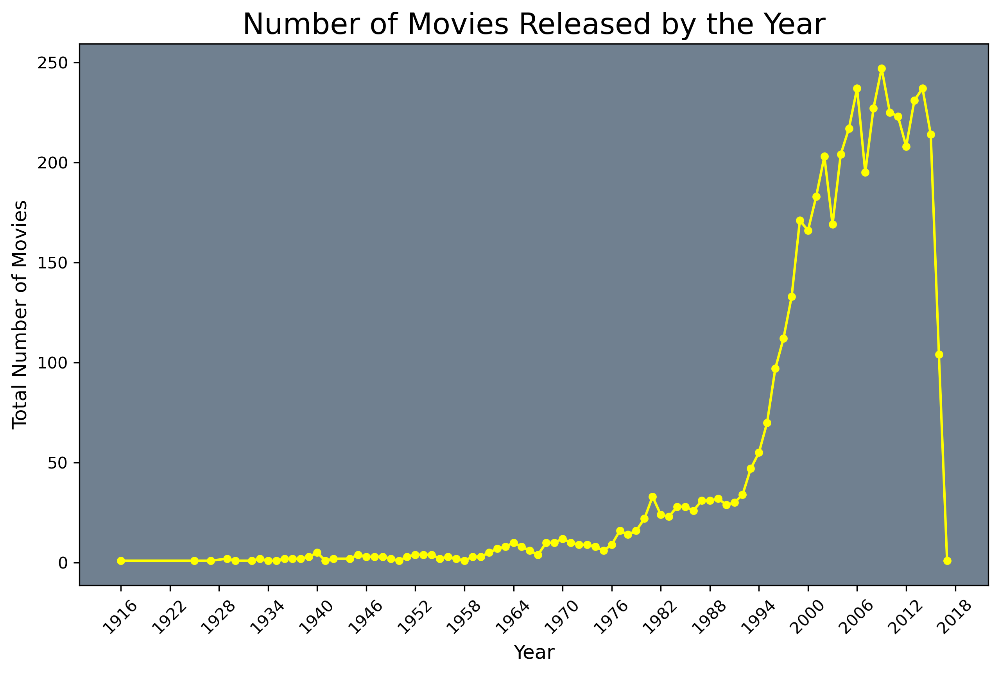

In [12]:
df["release_date"] = pd.to_datetime(df['release_date'], format='%Y-%m-%d')
year_count = df['release_date'].groupby(df["release_date"].dt.year).agg('count')
year_count.plot(color='yellow', marker="o", markersize="4")
plt.title("Number of Movies Released by the Year", size=18)
plt.xticks(np.arange(min(year_count.index), max(year_count.index)+3,6), rotation=45)
plt.xlabel("Year", size=12)
plt.ylabel("Total Number of Movies", size=12)

-->Now Adding two new columns to the df DataFrame, one for the year and one for the month of the release date,creating a new DataFrame df_btw that only contains the rows where the release date is between 1999 and 2017 and grouping df_btw DataFrame by year and month, counting the number of movies released in each group, and converting the result to it.

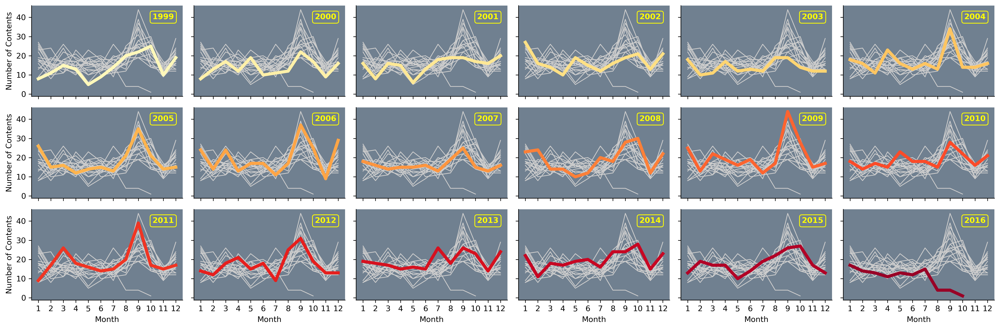

In [13]:
df["year"] = df["release_date"].dt.strftime("%Y")
df["month"] = df["release_date"].dt.month
df_btw = df[(df["release_date"].dt.year >= 1999) & (df["release_date"].dt.year < 2017)]
df_btw = df_btw.groupby(["year", "month"])["original_title"].count().to_frame().reset_index()

series = sns.relplot(
    data=df_btw,
    x="month", y="original_title", col="year", hue="year",
    kind="line", palette="YlOrRd", linewidth=4, zorder=5,
    col_wrap=6, height=2, aspect=1.5, legend=False,
)

for year, ax in series.axes_dict.items():
    
    ax.text(.8, .85, year, transform=ax.transAxes, fontweight="bold", color="yellow",
           bbox=dict(facecolor='none', edgecolor='yellow', boxstyle='round'))
    
    sns.lineplot(
        data=df_btw, x="month", y="original_title", units="year",
        estimator=None, color=".8", linewidth=1, ax=ax)

ax.set_xticks(np.arange(min(df_btw.month), max(df_btw.month)+1, 1))
series.set_titles("")
series.set_axis_labels("Month", "Number of Contents")
series.tight_layout()

In [14]:
genres = df["genres"].str.split(', ', expand=True).stack()
genres = genres.value_counts().reset_index(name="count")
fig = px.treemap(genres, path=['index'], values='count')
fig.update_layout(title_text='Number of Contents by Genres',
                  title_x=0.5, title_font=dict(size=18))
fig.update_traces(textinfo="label+value")
fig.show("notebook")

Examining the popularity and runtime comparison of the 10 directors with the most movies, based on the movies they have directed alone.

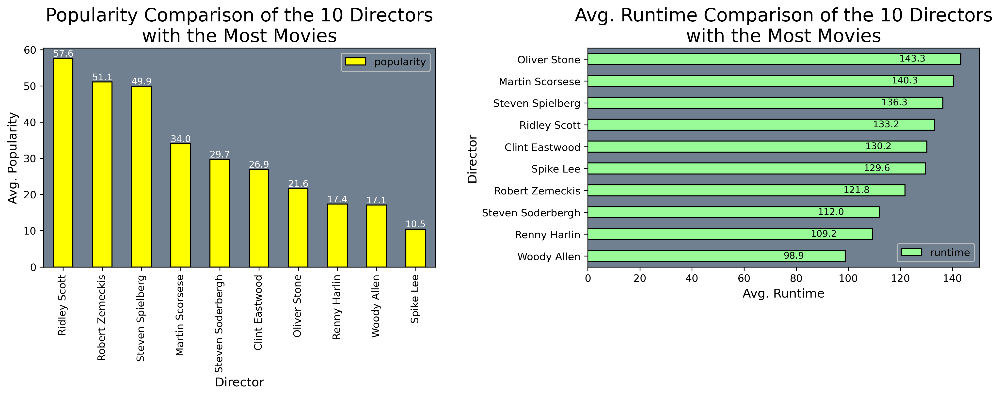

In [15]:
df['director'].replace('', np.nan, inplace=True)
df.dropna(subset=['director'], inplace=True)
director_list = list(df["director"].value_counts().head(10).index)
directors = df[df.director.str.contains('|'.join(director_list)) & (~df.director.str.contains(","))]

fig, ax = plt.subplots(1,2, figsize=(14,6))

directors.groupby("director")["popularity"].mean().to_frame().sort_values(by="popularity",
                                                                     ascending=False).plot(ax=ax[0], 
                                                                                  kind="bar",
                                                                                  color="yellow",
                                                                                  edgecolor="black")

directors.groupby("director")["runtime"].mean().to_frame().sort_values(by="runtime",
                                                                     ascending=True).plot(ax=ax[1], 
                                                                                 kind="barh",
                                                                                 color="palegreen",
                                                                                 edgecolor="black")

ax[0].bar_label(ax[0].containers[0], fmt='%.1f', color="white", fontsize=9)
ax[0].set_title("Popularity Comparison of the 10 Directors\nwith the Most Movies", size=18)
ax[0].set_xlabel("Director", size=12)
ax[0].set_ylabel("Avg. Popularity", size=12)

ax[1].bar_label(ax[1].containers[0], fmt='%.1f', color="black", fontsize=9, padding=-60)
ax[1].set_title("Avg. Runtime Comparison of the 10 Directors\nwith the Most Movies", size=18)
ax[1].set_xlabel("Avg. Runtime", size=12)
ax[1].set_ylabel("Director", size=12)

plt.tight_layout(pad=3)

# <h1 style="background-color:slategray; color:lightyellow;">General Recommender

In this part, we will create a general recommendation system that makes recommendations to the user based on the movie popularity and IMDB weighted ranking for specific genres.

In [16]:
class content_bringer:
    
    def __init__(self, df):
        self.df = df
        
    def popularity_based(self, genre):
        genre = str(genre).upper()
        
        if genre == "ALL":
            df_popularity = self.df[["original_title", 
                                     "popularity"]].sort_values(by="popularity", ascending=False).head(10)
            
        else:
            self.df["genres"] = self.df["genres"].str.upper()
            df_popularity = self.df[self.df["genres"].str.contains(genre)]
            df_popularity = df_popularity[["original_title",
                                     "popularity"]].sort_values(by="popularity", ascending=False).head(10)

        popularity = df_popularity.style.set_properties(**{'background-color': 'lightpink',
                                    'border': '1.3px solid green',
                                    'color': 'black', 
                                    'text-align': 'center'}).set_table_styles([ dict(selector='th', 
                                                            props=[('text-align', 'center'),
                                                                   ('background-color', 'skyblue'),
                                                                   ('border-style','solid')])])
        return popularity
        
    def weighted_rank_based(self, genre):
        C = self.df['vote_average'].mean()
        m = self.df["vote_count"].quantile(.95)
        wr_df = self.df.copy().loc[df['vote_count'] >= m]
        
        def wr_calculator(wr_df, m=m, C=C):
            v = wr_df["vote_count"]
            R = wr_df['vote_average']
            wr = (v /(v + m) * R) + (m /(v + m) * C) # IMDB formula
            return wr
        
        wr_df["WR"] = wr_df.apply(wr_calculator, axis=1)
        genre = str(genre).upper()
        
        if genre == "ALL":
            wr_df = wr_df[["original_title", "WR"]].sort_values(by="WR", ascending=False).head(10)
            
        else:
            wr_df["genres"] = wr_df["genres"].str.upper()
            wr_df = wr_df[wr_df["genres"].str.contains(genre)]
            wr_df = wr_df[["original_title", "WR"]].sort_values(by="WR", ascending=False).head(10)
        
        weighted_rank = wr_df.style.set_properties(**{'background-color': 'gold',
                               'border': '1.3px solid green',
                               'color': 'black', 
                               'text-align': 'center'}).set_table_styles([ dict(selector='th', 
                                                      props=[('text-align', 'center'),
                                                             ('background-color', 'skyblue'),
                                                             ('border-style','solid')])])
        return weighted_rank
    
    def comparison(self, genre):
        
        def column_painter(x):
            df_color = x.copy()
            df_color[['Based on Popularity']] = 'background-color: lime'
            df_color[['Based on WR']] = 'background-color: gold'
            return df_color
        
        popularity_based = self.popularity_based(genre).data
        popularity_based = popularity_based.reset_index(drop=True)
        wr_based = self.weighted_rank_based(genre).data
        wr_based = wr_based.reset_index(drop=True)
        
        df_comp = pd.concat([popularity_based, wr_based], axis=1)
            
        df_comp.columns = pd.MultiIndex.from_tuples([("Based on Popularity", "original_title"), 
                                                ("Based on Popularity", "popularity"),
                                               ("Based on WR", "original_title"),
                                               ("Based on WR", "WR")])
        df_comp = df_comp.apply(lambda x: x.dropna().reset_index(drop = True))
        display(df_comp.style.apply(column_painter, 
                             axis=None).set_properties(**{'border': '1.3px solid green',
                                'color': 'black', 
                                'text-align': 'center'}).set_table_styles([ dict(selector='th', 
                                                        props=[('text-align', 'center'),
                                                               ('background-color', 'skyblue'),
                                                               ('color', 'black'),
                                                               ('border-style','solid')])]))


<h3 style="color:magenta;">1-Recommendation by Popularity (General Recommender)

In [17]:
general_recommender = content_bringer(df)
general_recommender.popularity_based("all")

,original_title,popularity
546,Minions,875.581305
95,Interstellar,724.247784
788,Deadpool,514.569956
94,Guardians of the Galaxy,481.098624
127,Mad Max: Fury Road,434.278564
28,Jurassic World,418.708552
199,Pirates of the Caribbean: The Curse of the Black Pearl,271.972889
82,Dawn of the Planet of the Apes,243.791743
200,The Hunger Games: Mockingjay - Part 1,206.227151
88,Big Hero 6,203.734590


<h3 style="color:magenta;">2-Recommendation by IMDB Weighted Rating Formula (General Recommender)

In [18]:
general_recommender.weighted_rank_based("all")

,original_title,WR
1881,The Shawshank Redemption,7.846002
65,The Dark Knight,7.771907
662,Fight Club,7.758535
96,Inception,7.734710
3232,Pulp Fiction,7.712183
95,Interstellar,7.659139
809,Forrest Gump,7.613394
3337,The Godfather,7.611771
329,The Lord of the Rings: The Return of the King,7.548233
262,The Lord of the Rings: The Fellowship of the Ring,7.504373


In [19]:
C = df['vote_average'].mean()
m = df["vote_count"].quantile(.95)
wr_df = df.copy().loc[df['vote_count'] >= m]

def wr_calculator(wr_df, m=m, C=C):
            v = wr_df["vote_count"]
            R = wr_df['vote_average']
            wr = (v /(v + m) * R) + (m /(v + m) * C) # IMDB formula
            return wr

wr_df["WR"] = wr_df.apply(wr_calculator, axis=1)
df_10 = wr_df.sort_values(by="WR", ascending=False).head(10)
df_10 = df_10.cast.str.split(', ', expand=True).stack().value_counts().reset_index(name="count")
df_10 = df_10[df_10["count"] > 1]
fig = px.treemap(df_10, path=['index'], values='count')
fig.update_layout(title_text='Actors/Actresses Mentioned More than Once\nin the Most Popular 10 Movies',
                  title_x=0.5, title_font=dict(size=18))
fig.update_traces(textinfo="label+value")
fig.show("notebook")

<h3>Popularity List

In [20]:
general_recommender.popularity_based("action")

,original_title,popularity
788,Deadpool,514.569956
94,Guardians of the Galaxy,481.098624
127,Mad Max: Fury Road,434.278564
28,Jurassic World,418.708552
199,Pirates of the Caribbean: The Curse of the Black Pearl,271.972889
82,Dawn of the Planet of the Apes,243.791743
88,Big Hero 6,203.734590
108,Terminator Genisys,202.042635
26,Captain America: Civil War,198.372395
65,The Dark Knight,187.322927


<h3>WR List

In [21]:
general_recommender.weighted_rank_based("action")

,original_title,WR
65,The Dark Knight,7.771907
96,Inception,7.734710
329,The Lord of the Rings: The Return of the King,7.548233
262,The Lord of the Rings: The Fellowship of the Ring,7.504373
1990,The Empire Strikes Back,7.479271
94,Guardians of the Galaxy,7.468474
2912,Star Wars,7.466340
330,The Lord of the Rings: The Two Towers,7.447235
634,The Matrix,7.438410
571,Inglourious Basterds,7.318161


Now comparison of the both lists:

In [22]:
general_recommender.comparison("action")

In [23]:
general_recommender.comparison("romance")

In [24]:
general_recommender.comparison("science fiction")

<h3 style="color:magenta;">3-Word-Based Recommendation (General Recommender)

this recommendations is based on certain words. These words can be a director's name, an actor's name, name of the production company or etc. For example "Movies Directed By Tim Burton", "Marvel Movies" or "Walt Disney Pictures"

In [25]:
def word_based_rec(search_word):
    
    df_wb = df.copy()
    
    check_columns = ["production_companies", "cast", "director"]
    
    for i in check_columns:
        df_wb[i] = df_wb[i].str.lower()
        
    wb_dfs = []
    search_word = search_word.lower()
    for i in check_columns:
        df_wb = df_wb[df_wb[i].str.contains(search_word)]
        wb_dfs.append(df_wb)
    df_wb = pd.concat(wb_dfs)
    collecting_list = []
    for i in df_wb["original_title"]:
        collecting_list.append(i)
    acc_system = pd.DataFrame(data={'Recomended Contents'+" ("+ search_word + ")": collecting_list})
    display(acc_system.head(10).style.set_properties(**{'background-color': 'mediumpurple',
                                 'border': '1.3px solid black',
                                 'color': 'white', 
                                 'text-align': 'center'}).set_table_styles([ dict(selector='th', 
                                                            props=[('text-align', 'center'),
                                                                   ('background-color', 'skyblue'),
                                                                   ('border-style','solid')])]))

In [26]:
word_based_rec("tim burton")
word_based_rec("marvel")
word_based_rec("Walt Disney Pictures")

,Recomended Contents (tim burton)
0,Alice in Wonderland
1,Alice Through the Looking Glass
2,Charlie and the Chocolate Factory
3,Dark Shadows
4,Planet of the Apes
5,Mars Attacks!
6,Big Fish
7,Abraham Lincoln: Vampire Hunter
8,Frankenweenie
9,Corpse Bride


,Recomended Contents (marvel)
0,Spider-Man 3
1,Avengers: Age of Ultron
2,The Avengers
3,The Amazing Spider-Man
4,Captain America: Civil War
5,Spider-Man 2
6,Iron Man 3
7,X-Men: The Last Stand
8,The Amazing Spider-Man 2
9,X-Men: Days of Future Past


,Recomended Contents (walt disney pictures)
0,Pirates of the Caribbean: At World's End
1,John Carter
2,Tangled
3,Pirates of the Caribbean: Dead Man's Chest
4,The Lone Ranger
5,Pirates of the Caribbean: On Stranger Tides
6,Alice in Wonderland
7,Monsters University
8,Oz: The Great and Powerful
9,TRON: Legacy


<h3 style="color:magenta;">4-Language-Based Recommendation (General Recommender)

And now let's say we have a Japanese user and we want to recommend some popular contents whose original language is Japanese.

In [27]:
def lang_based_rec(lang, df=df):
    df_lang = df.copy()
    df_lang = df_lang[df_lang["original_language"] == lang]
    df_lang = df_lang.sort_values(by=['popularity'], ascending=False)
    df_lang = df_lang["original_title"].head(10).to_frame().reset_index(drop=True)
    df_lang = df_lang.rename({'original_title': 'Popular Contents in '+ lang.upper()}, axis=1)
    display(df_lang.style.set_properties(**{'background-color': 'azure',
                     'border': '1.3px solid black',
                     'color': 'black', 
                     'text-align': 'center'}).set_table_styles([ dict(selector='th', 
                                                 props=[('text-align', 'center'),
                                                        ('background-color', 'skyblue'),
                                                        ('border-style','solid')])]))

In [28]:
lang_based_rec("ja")

,Popular Contents in JA
0,千と千尋の神隠し
1,もののけ姫
2,ハウルの動く城
3,七人の侍
4,崖の上のポニョ
5,キャプテンハーロック
6,シン・ゴジラ
7,Pokémon 3: The Movie
8,Brother
9,Space Battleship Yamato


<h1 style="background-color:slategray; color:lightpink;"> Content Based Recommedation System Using Cosine Similarity

Sometimes people watch a movie and then see that they get recommendations similar to the movie they have watched. This similarity can be the type of the movie, the name of the movie, the actors/the actresses , the director and the overview etc.

<h3 style="color:magenta;">1-Overview Based Recommendation

First step, it might make sense to recommend movies to users that have a similar overview to the movie they have watched in the past.

In [29]:
def overview_based_rec(content_name, df=df):
    
    tfidf = TfidfVectorizer(stop_words='english')
    mtrx = tfidf.fit_transform(df['overview'])
    cosine_sim = linear_kernel(mtrx, mtrx)
    
    ow_sim_df = df.copy()
    ow_sim_df = ow_sim_df.reset_index()
    contents = ow_sim_df["original_title"]
    indices = pd.Series(ow_sim_df.index, index=ow_sim_df['original_title'])
    idx = indices[content_name]
    sim_scores = list(enumerate(cosine_sim[idx]))
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    sim_scores = sim_scores[1:11]
    movie_indices = [i[0] for i in sim_scores]
    rec_frame = contents.iloc[movie_indices].to_frame().reset_index(drop=True)
    rec_frame = rec_frame.rename({'original_title': 'Recommendations'}, axis=1)
    rec_frame = rec_frame.style.set_properties(**{'background-color': 'turquoise',
                          'border': '1.3px solid green',
                          'color': 'black', 
                          'text-align': 'center'}).set_table_styles([ dict(selector='th', 
                                                    props=[('text-align', 'center'),
                                                           ('background-color', 'skyblue'),
                                                           ('border-style','solid')])])
    return rec_frame

In [30]:
overview_based_rec("Harry Potter and the Half-Blood Prince")

,Recommendations
0,Harry Potter and the Goblet of Fire
1,Harry Potter and the Order of the Phoenix
2,Harry Potter and the Chamber of Secrets
3,The Little Prince
4,"Run, Hide, Die"
5,Harry Potter and the Philosopher's Stone
6,Plush
7,Sinister 2
8,Domestic Disturbance
9,Stir of Echoes


<h3 style="color:MAGENTA;">2-Cast, Genres, Director and Keywords Based Recommendation

Recommendation system with parameters such as director, cast, genres etc. and try to make recommendations based on these parameters as well.

In [31]:
def content_based_rec(content_name, dir_weight=1, cast_weight=1, df=df):
    
    def arrangement(data):
        arr_data = data.split(",")
        arr_data = [i.replace(" ", "").lower() for i in arr_data]
        arr_data = ' '.join(map(str, arr_data))
        return arr_data

    def cast_func(people):
        names = people.split(",")
        if len(names) > 3:
            names = names[:3]
        names = ','.join(map(str, names))
        return names
    
    def cast_dir_arr(data):
        arr_data = ' '.join(map(str, data))
        return arr_data

    df_rec = df.copy()
    
    columns_to_arr = ['cast', 'keywords', 'director', 'genres']

    for column in columns_to_arr:
        if column == 'cast':
            df_rec[column] = df_rec[column].apply(cast_func)
        df_rec[column] = df_rec[column].apply(arrangement)
        
    
    df_rec["director"] = df_rec["director"].apply(lambda x: [x]*dir_weight)
    df_rec["director"] = df_rec["director"].apply(cast_dir_arr)
    
    df_rec["cast"] = df_rec["cast"].apply(lambda x: [x]*cast_weight)
    df_rec["cast"] = df_rec["cast"].apply(cast_dir_arr)
        
    df_rec["mix"] = df_rec["genres"] + " " + df_rec["keywords"] + " " + df_rec["cast"] + " " +df_rec["director"]

    count = CountVectorizer(stop_words='english')
    count_matrix = count.fit_transform(df_rec['mix'])
    cos_sim = cosine_similarity(count_matrix, count_matrix)
    
    df_rec = df_rec.reset_index()
    indices = pd.Series(df_rec.index, index=df_rec['original_title'])
    
    idx = indices[content_name]
    
    sim_scores = list(enumerate(cos_sim[idx]))
    
    sim_scores = sorted(sim_scores, key=lambda x: x[1], reverse=True)
    
    sim_scores = sim_scores[1:11]
    movie_indices = [i[0] for i in sim_scores]
    contents = df_rec["original_title"]
    rec_frame = contents.iloc[movie_indices].to_frame().reset_index(drop=True)
    rec_frame = rec_frame.rename({'original_title': 'Recommendations'}, axis=1)
    rec_frame = rec_frame.style.set_properties(**{'background-color': 'pink',
                          'border': '1.3px solid green',
                          'color': 'black', 
                          'text-align': 'center'}).set_table_styles([ dict(selector='th', 
                                                     props=[('text-align', 'center'),
                                                            ('background-color', 'skyblue'),
                                                            ('border-style','solid')])])
    return rec_frame

In [32]:
content_based_rec("The Smurfs")

,Recommendations
0,The Smurfs 2
1,Return to Never Land
2,Up
3,Aladdin
4,Shrek Forever After
5,The House of Magic
6,Valiant
7,Alpha and Omega: The Legend of the Saw Tooth Cave
8,Epic
9,Delgo


In [33]:
content_based_rec("Titanic")

,Recommendations
0,Revolutionary Road
1,Romeo + Juliet
2,Trash
3,Love Letters
4,The Time Traveler's Wife
5,Angel Eyes
6,A Walk to Remember
7,Iris
8,The Great Gatsby
9,"Tango, no me dejes nunca"


We can increase the "dir_weight" parameter to get a director weighted recommendation.

In [34]:
content_based_rec("Titanic", dir_weight=3)

,Recommendations
0,The Terminator
1,Terminator 2: Judgment Day
2,The Abyss
3,Aliens
4,True Lies
5,Avatar
6,Revolutionary Road
7,The Time Traveler's Wife
8,Romeo + Juliet
9,Trash


let's assume that a user has watched three different type of movies and we want to make recommendations based on these movies in a list. Let's take the top 3 movies closest to each movie in terms of similarity score.

In [35]:
def comb_rec(mov_1, mov_2, mov_3):
    
    m1 = content_based_rec(mov_1).data.head(3) #first movie
    m2 = content_based_rec(mov_2).data.head(3) #second movie
    m3 = content_based_rec(mov_3).data.head(3) # third movie
    
    movie_list = [m1, m2, m3]
    rec_movies = pd.concat(movie_list).drop_duplicates()
    watched_mov = [mov_1, mov_2, mov_3]
    rec_movies = rec_movies[~rec_movies['Recommendations'].isin(watched_mov)]
    rec_movies = rec_movies.sample(rec_movies.shape[0]).reset_index(drop=True)
    rec_movies = rec_movies.rename({'Recommendations': 'You May Also Like'}, axis=1)
    rec_movies = rec_movies.style.set_properties(**{'background-color': 'navy',
                             'border': '1.3px solid orange',
                             'color': 'white', 
                             'text-align': 'center'}).set_table_styles([ dict(selector='th', 
                                                        props=[('text-align', 'center'),
                                                               ('background-color', 'skyblue'),
                                                               ('border-style','solid')])])
    return rec_movies

Assuming that the user has watched movies "Titanic", "Toy Story 3" and "The Final Destination".

In [36]:
comb_rec("Titanic", "The Dark Knight", "The Final Destination")

,You May Also Like
0,Days of Thunder
1,Trash
2,Batman Begins
3,Book of Shadows: Blair Witch 2
4,The Dark Knight Rises
5,Final Destination 2
6,Revolutionary Road
7,Romeo + Juliet
8,Batman & Robin


 <h1 style="background-color:slategray; color:lightpink;">Recommendation using KNN

 K-Nearest Neighbors (KNN) is a classification algorithm. The central idea is that data points with similar attributes tend to fall into similar categories.If you have a dataset of points where the class of each point is known, you can take a new point with an unknown class, find it’s nearest neighbors, and classify it.

<h3 style="color:magenta;">1. Calculating Distance

If we have two features, this means we have 2D data, and we can simply calculate distance between two features by returning the square root of the total of square of the differences of each feature as follows:

In [37]:
star_wars = [125, 1977]
raiders = [115, 1981]
mean_girls = [97, 2004]

In [38]:
def distance(movie1, movie2):
    squared_difference = 0
    for i in range(len(movie1)):
        squared_difference += (movie1[i] - movie2[i]) ** 2
    final_distance = squared_difference ** 0.5
    return final_distance

print(distance(star_wars,raiders ))
print(distance(star_wars,mean_girls))

10.770329614269007
38.897300677553446


Let’s say this third dimension is the movie’s budget. We now have to find the distance between these two points in three dimensions.

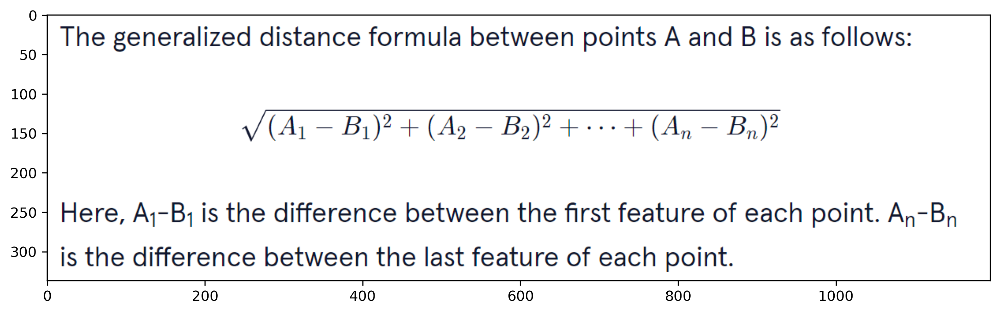

In [39]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(12,10))
plt.imshow(plt.imread(r"C:\Users\dell\Desktop\data\Capture.PNG"))

Using this formula above, we can find the K-Nearest Neighbors of a point in N-dimensional space

<h3 style="color:magenta;">2. Data Normalization

Consider the two dimensions of release date and budget. The maximum difference between two movies’ release dates is about 125 years (The Lumière Brothers were making movies in the 1890s). However, the difference between two movies’ budget can be millions of dollars.Another way of thinking about this is that the budget completely outweighs the importance of all other dimensions because it is on such a huge scale. The fact that two movies were 70 years apart is essentially meaningless compared to the difference in millions in the other dimension. Therefore, we need to normalize the data before applying K Nearest Neightbors Algorithm which makes every value be between 0 and 1.

In [40]:
release_dates = [1897, 1998, 2000, 1948, 1962, 1950, 1975, 1960, 2017, 1937, 1968, 1996, 1944, 1891, 1995, 1948, 2011, 1965, 1891, 1978]
def min_max_normalize(lst):
    minimum = min(lst)
    maximum = max(lst)
    normalized = list()
    for i in lst:
        normalized.append((i-minimum)/(maximum-minimum))
    return normalized
print(min_max_normalize(release_dates))

[0.047619047619047616, 0.8492063492063492, 0.8650793650793651, 0.4523809523809524, 0.5634920634920635, 0.46825396825396826, 0.6666666666666666, 0.5476190476190477, 1.0, 0.36507936507936506, 0.6111111111111112, 0.8333333333333334, 0.42063492063492064, 0.0, 0.8253968253968254, 0.4523809523809524, 0.9523809523809523, 0.5873015873015873, 0.0, 0.6904761904761905]


By using this function we make all the data be between 0 and 1.

3. Finding the Nearest Neighbors

In order to find the 5 nearest neighbors, we need to compare this new unclassified movie to every other movie in the dataset. This means we’re going to be using the distance formula again and again. We ultimately want to end up with a sorted list of distances and the movies associated with those distances.

In [64]:
df = pd.read_csv(r"C:\Users\dell\Desktop\data\movies_metadata.csv")
df.head()

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,release_date,revenue,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",http://toystory.disney.com/toy-story,862,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",...,1995-10-30,373554033.0,81.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Toy Story,False,7.7,5415.0
1,False,NaN,65000000,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",NaN,8844,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,...,1995-12-15,262797249.0,104.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0
2,False,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",0,"[{'id': 10749, 'name': 'Romance'}, {'id': 35, ...",NaN,15602,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,...,1995-12-22,0.0,101.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92.0
3,False,NaN,16000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,31357,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",...,1995-12-22,81452156.0,127.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Friends are the people who let you be yourself...,Waiting to Exhale,False,6.1,34.0
4,False,"{'id': 96871, 'name': 'Father of the Bride Col...",0,"[{'id': 35, 'name': 'Comedy'}]",NaN,11862,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,...,1995-02-10,76578911.0,106.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,False,5.7,173.0


In [42]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45466 entries, 0 to 45465
Data columns (total 24 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   adult                  45466 non-null  object 
 1   belongs_to_collection  4494 non-null   object 
 2   budget                 45466 non-null  object 
 3   genres                 45466 non-null  object 
 4   homepage               7782 non-null   object 
 5   id                     45466 non-null  object 
 6   imdb_id                45449 non-null  object 
 7   original_language      45455 non-null  object 
 8   original_title         45466 non-null  object 
 9   overview               44512 non-null  object 
 10  popularity             45461 non-null  object 
 11  poster_path            45080 non-null  object 
 12  production_companies   45463 non-null  object 
 13  production_countries   45463 non-null  object 
 14  release_date           45379 non-null  object 
 15  re

In [43]:
def distance(movie1, movie2):
    squared_difference = 0
    for i in range(len(movie1)):
        squared_difference += (movie1[i] - movie2[i]) ** 2
    final_distance = squared_difference ** 0.5
    return final_distance

In [44]:
distance([df.iloc[0]["revenue"],df.iloc[0]["runtime"],df.iloc[0]["vote_average"]],[df.iloc[1]["revenue"],df.iloc[1]["runtime"],df.iloc[0]["vote_average"]])


110756784.00000238

This is the distance calculation between the first and second filme in the dataset based on three columns in the dataset

In [45]:
def classify(unknown,dataset, k):
    distances = list()
    for row_number, row in dataset.iterrows():
        movie = [row["revenue"],row["runtime"],row["vote_average"]]
        distance_to_point = distance(movie, unknown)
        distances.append([distance_to_point,row["title"]])
    distances.sort()
    neighbors = distances[:k]
    return neighbors
print(classify([373554033, 91, 8],df,5))

[[10.004498987955369, 'Toy Story'], [557674.0011652058, 'What Women Want'], [664640.001806429, 'Batman Begins'], [1319169.0001852834, 'The Golden Compass'], [1613962.0000798316, 'The Adventures of Tintin']]


Above we see the 5 nearest neigbors to the example film from the entire dataset based on calculation of three features.We’ve now found the k nearest neighbors, and have stored them in a list that looks like in the list above.

<h3 style="color:magenta;">4. Classify Movie

Our goal now is to count the number of good movies and bad movies in the list of neighbors. If more of the neighbors were good, then the algorithm will classify the unknown movie as good. Otherwise, it will classify it as bad. Lets use popularity column to create a label column that shows 0 or 1 based on their popularity

In [46]:
df.isnull().sum()
df.drop(["belongs_to_collection","homepage","tagline","overview","poster_path","imdb_id","original_language"], axis=1,inplace=True)

In [47]:
df["popularity"].fillna(value=df["popularity"].mode(),inplace=True)
df["popularity"] = pd.to_numeric(df["popularity"],errors ='coerce')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45466 entries, 0 to 45465
Data columns (total 17 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   adult                 45466 non-null  object 
 1   budget                45466 non-null  object 
 2   genres                45466 non-null  object 
 3   id                    45466 non-null  object 
 4   original_title        45466 non-null  object 
 5   popularity            45460 non-null  float64
 6   production_companies  45463 non-null  object 
 7   production_countries  45463 non-null  object 
 8   release_date          45379 non-null  object 
 9   revenue               45460 non-null  float64
 10  runtime               45203 non-null  float64
 11  spoken_languages      45460 non-null  object 
 12  status                45379 non-null  object 
 13  title                 45460 non-null  object 
 14  video                 45460 non-null  object 
 15  vote_average       

In [48]:
def label_encoder(row):
    if row["popularity"] > 2.92:
        return 1
    else:
        return 0

In [49]:
df["label"] = df.apply(lambda row: label_encoder(row), axis=1)
df.head(3)

,adult,budget,genres,id,original_title,popularity,production_companies,production_countries,release_date,revenue,runtime,spoken_languages,status,title,video,vote_average,vote_count,label
0,False,30000000,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",862,Toy Story,21.946943,"[{'name': 'Pixar Animation Studios', 'id': 3}]","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-10-30,373554033.0,81.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Toy Story,False,7.7,5415.0,1
1,False,65000000,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",8844,Jumanji,17.015539,"[{'name': 'TriStar Pictures', 'id': 559}, {'na...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-15,262797249.0,104.0,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,Jumanji,False,6.9,2413.0,1
2,False,0,"[{'id': 10749, 'name': 'Romance'}, {'id': 35, ...",15602,Grumpier Old Men,11.712900,"[{'name': 'Warner Bros.', 'id': 6194}, {'name'...","[{'iso_3166_1': 'US', 'name': 'United States o...",1995-12-22,0.0,101.0,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Grumpier Old Men,False,6.5,92.0,1


In [50]:
def classify(unknown,dataset,labels, k):
    distances = list()
    for row_number, row in dataset.iterrows():
        movie = [row["revenue"],row["runtime"],row["vote_average"]]
        distance_to_point = distance(movie, unknown)
        distances.append([distance_to_point,row["title"],row["label"]])
    distances.sort()
    neighbors = distances[0:k]
    num_good = 0
    num_bad = 0
    for neighbor in neighbors:
        label = neighbor[2]
        if label == 0:
            num_bad += 1
        elif label == 1:
            num_good += 1
    if num_good > num_bad:
        return 1
    else:
        return 0
print(classify([373554033, 91, 8],df,df["label"],5))

1


The classifier is now able to predict whether a movie will be good or bad and returns 1 if it is good or returns 0 if it is bad.

<h3 style="color:magenta;">5.Using Sklearn Builtin K Neares Neighbors Algorithm

Now that that's K-Nearest Neighbor classifier is written from scratch, and now that's another way of using KNN:

In [51]:
df.drop(["id","genres","spoken_languages","title","original_title","production_companies","production_countries"],axis=1,inplace=True)
df.head(3)

,adult,budget,popularity,release_date,revenue,runtime,status,video,vote_average,vote_count,label
0,False,30000000,21.946943,1995-10-30,373554033.0,81.0,Released,False,7.7,5415.0,1
1,False,65000000,17.015539,1995-12-15,262797249.0,104.0,Released,False,6.9,2413.0,1
2,False,0,11.712900,1995-12-22,0.0,101.0,Released,False,6.5,92.0,1


<h5 style="color:magenta;">* Data Preprocessing

First of all we need to fill or ged tird of missing values for each columns

In [52]:
df.isnull().sum()

adult             0
budget            0
popularity        6
release_date     87
revenue           6
runtime         263
status           87
video             6
vote_average      6
vote_count        6
label             0
dtype: int64

In [53]:
df["release_date"].fillna("2008-01-01",inplace=True)
df["revenue"].fillna(df["revenue"].mean(),inplace=True)
df["runtime"].fillna(df["runtime"].mean(),inplace=True)
df["status"].fillna("Released",inplace=True)
df["video"].fillna("False",inplace=True)
df["popularity"].fillna(df["popularity"].mean(),inplace=True)
df["vote_average"].fillna(df["vote_average"].mean(),inplace=True)
df["vote_count"].fillna(df["vote_count"].mean(),inplace=True)

In [54]:
df.isnull().sum()

adult           0
budget          0
popularity      0
release_date    0
revenue         0
runtime         0
status          0
video           0
vote_average    0
vote_count      0
label           0
dtype: int64

Secondly we need to do some feature engineering.

In [55]:
df["release_year"] = df["release_date"].apply(lambda x : int(x[:4]))
df["release_month"] = df["release_date"].apply(lambda x : x[5:7])
df = df[df["release_month"]!= ""]
df["release_month"] = df["release_month"].apply(lambda x : int())
df.drop("release_date",axis=1,inplace=True)
df["budget"] = df["budget"].apply(lambda x: float(x))
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45463 entries, 0 to 45465
Data columns (total 12 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   adult          45463 non-null  object 
 1   budget         45463 non-null  float64
 2   popularity     45463 non-null  float64
 3   revenue        45463 non-null  float64
 4   runtime        45463 non-null  float64
 5   status         45463 non-null  object 
 6   video          45463 non-null  object 
 7   vote_average   45463 non-null  float64
 8   vote_count     45463 non-null  float64
 9   label          45463 non-null  int64  
 10  release_year   45463 non-null  int64  
 11  release_month  45463 non-null  int64  
dtypes: float64(6), int64(3), object(3)
memory usage: 4.5+ MB


The next step is to deal with columns with non numerical values.

In [56]:
for i in df.select_dtypes("object").columns:
    print(f"Column {i} has these type of data: {df[i].nunique()}")
    print("~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~")

Column adult has these type of data: 2
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Column status has these type of data: 6
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
Column video has these type of data: 3
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~


In [57]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df["adult"] = le.fit_transform(df["adult"])
df_transformed = pd.get_dummies(df, columns=["status","video"])
df_transformed

,adult,budget,popularity,revenue,runtime,vote_average,vote_count,label,release_year,release_month,status_Canceled,status_In Production,status_Planned,status_Post Production,status_Released,status_Rumored,video_False,video_True,video_False
0,0,30000000.0,21.946943,373554033.0,81.0,7.7,5415.0,1,1995,0,0,0,0,0,1,0,1,0,0
1,0,65000000.0,17.015539,262797249.0,104.0,6.9,2413.0,1,1995,0,0,0,0,0,1,0,1,0,0
2,0,0.0,11.712900,0.0,101.0,6.5,92.0,1,1995,0,0,0,0,0,1,0,1,0,0
3,0,16000000.0,3.859495,81452156.0,127.0,6.1,34.0,1,1995,0,0,0,0,0,1,0,1,0,0
4,0,0.0,8.387519,76578911.0,106.0,5.7,173.0,1,1995,0,0,0,0,0,1,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45461,0,0.0,0.072051,0.0,90.0,4.0,1.0,0,2008,0,0,0,0,0,1,0,1,0,0
45462,0,0.0,0.178241,0.0,360.0,9.0,3.0,0,2011,0,0,0,0,0,1,0,1,0,0
45463,0,0.0,0.903007,0.0,90.0,3.8,6.0,0,2003,0,0,0,0,0,1,0,1,0,0
45464,0,0.0,0.003503,0.0,87.0,0.0,0.0,0,1917,0,0,0,0,0,1,0,1,0,0


Now all the columns are numerical as it is seen below:

In [58]:
df_transformed.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 45463 entries, 0 to 45465
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   adult                   45463 non-null  int32  
 1   budget                  45463 non-null  float64
 2   popularity              45463 non-null  float64
 3   revenue                 45463 non-null  float64
 4   runtime                 45463 non-null  float64
 5   vote_average            45463 non-null  float64
 6   vote_count              45463 non-null  float64
 7   label                   45463 non-null  int64  
 8   release_year            45463 non-null  int64  
 9   release_month           45463 non-null  int64  
 10  status_Canceled         45463 non-null  uint8  
 11  status_In Production    45463 non-null  uint8  
 12  status_Planned          45463 non-null  uint8  
 13  status_Post Production  45463 non-null  uint8  
 14  status_Released         45463 non-null

Here we split data into training and test set.

In [59]:
X = df_transformed.drop("label",axis=1)
y = df_transformed["label"]
from sklearn.model_selection import train_test_split
X_train, X_test, y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=101)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(36370, 18)
(9093, 18)
(36370,)
(9093,)


Here we rescale the data before applying the algorithm.

In [60]:
from sklearn.preprocessing import StandardScaler
ss = StandardScaler()
X_train = ss.fit_transform(X_train)
X_test = ss.transform(X_test)

# <h2 style="color:magenta;">Confusion matrix,precision, recall,F1-score, accuracy 

In [61]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X_train,y_train) 
predictions=knn.predict(X_test)
from sklearn.metrics import classification_report, confusion_matrix, silhouette_score
print("This is the confusion Matrix")
print(confusion_matrix(y_test,predictions))
print("~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~")
print(silhouette_score(X_test,y_test))
print("~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~")
print(classification_report(y_test,predictions))

This is the confusion Matrix
[[6368   85]
 [ 130 2510]]
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
0.15968159062365228
~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      6453
           1       0.97      0.95      0.96      2640

    accuracy                           0.98      9093
   macro avg       0.97      0.97      0.97      9093
weighted avg       0.98      0.98      0.98      9093



<h3>The algorithm has % 98 accuracy<h3>

<h1 style="background-color:slategray; color:lightpink;"> Recommendation using SVD Model:

In [65]:
import pandas as pd
dfr = pd.read_csv(r'C:\Users\dell\Desktop\data\ratings.csv')

In [66]:
df = df[['id', 'title', 'genres']]
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45466 entries, 0 to 45465
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   id      45466 non-null  object
 1   title   45460 non-null  object
 2   genres  45466 non-null  object
dtypes: object(3)
memory usage: 1.0+ MB


 I will do a bit of Data Cleaning. First I want to see if I have duplicates in my 'id' column.

In [67]:
df['id'].value_counts().sort_values(ascending=False)

141971    3
159849    2
168538    2
298721    2
265189    2
         ..
111109    1
67758     1
227506    1
49271     1
461257    1
Name: id, Length: 45436, dtype: int64

We can see that the answer is yes. Lets remove the duplicates.

In [68]:
df.drop_duplicates(inplace=True)

Now, we saw that the type of 'id' is 'object'. I want to look why it is not a numeric type, so I will look for rows with strings other than digits.

In [69]:
df[df['id'].str.contains("\D")]

,id,title,genres
19730,1997-08-20,NaN,"[{'name': 'Carousel Productions', 'id': 11176}..."
29503,2012-09-29,NaN,"[{'name': 'Aniplex', 'id': 2883}, {'name': 'Go..."
35587,2014-01-01,NaN,"[{'name': 'Odyssey Media', 'id': 17161}, {'nam..."


We found 3 rows. I will remove them.

In [70]:
df.drop([19730, 29503, 35587], inplace=True)
df['id'] = pd.to_numeric(df['id'])
df.sort_values(by='id')

,id,title,genres
4342,2,Ariel,"[{'id': 18, 'name': 'Drama'}, {'id': 80, 'name..."
12947,3,Shadows in Paradise,"[{'id': 18, 'name': 'Drama'}, {'id': 35, 'name..."
17,5,Four Rooms,"[{'id': 80, 'name': 'Crime'}, {'id': 35, 'name..."
474,6,Judgment Night,"[{'id': 28, 'name': 'Action'}, {'id': 53, 'nam..."
256,11,Star Wars,"[{'id': 12, 'name': 'Adventure'}, {'id': 28, '..."
...,...,...,...
45078,465044,Abduction,"[{'id': 14, 'name': 'Fantasy'}, {'id': 18, 'na..."
45273,467731,Tragedy in a Temporary Town,"[{'id': 18, 'name': 'Drama'}]"
21891,468343,Silja - nuorena nukkunut,"[{'id': 18, 'name': 'Drama'}, {'id': 10749, 'n..."
45398,468707,Thick Lashes of Lauri Mäntyvaara,"[{'id': 10749, 'name': 'Romance'}, {'id': 35, ..."


One more thing we can see is that the id's of the movies has missing values. for example: 1, 4... It may cause us some problems when we will want to merge it with the ratings dataframe.

So let's explore the ratings:

In [71]:
dfr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26024289 entries, 0 to 26024288
Data columns (total 4 columns):
 #   Column     Dtype  
---  ------     -----  
 0   userId     int64  
 1   movieId    int64  
 2   rating     float64
 3   timestamp  int64  
dtypes: float64(1), int64(3)
memory usage: 794.2 MB


We can see that we have a lot of rows - more than 26 million. For computing time reasons I will sample the data to 20%

In [72]:
dfr = dfr.sample(frac=0.2, random_state=5)

Now let's see a bit of how the table looks like:

In [73]:
dfr.head(20)

,userId,movieId,rating,timestamp
15357206,159873,79132,4.0,1430046273
21259198,220816,1645,3.5,1407080618
25499163,265403,2238,4.0,945144638
10773318,111234,106002,3.0,1476496314
18189535,188711,1527,4.0,941494434
7972548,82193,2273,3.5,1287597782
6246568,64444,318,5.0,1481497597
20454875,212558,3578,4.5,1247798055
7161628,73897,457,4.0,835946428
17835747,185074,6094,2.5,1119305759


In [74]:
dfr.sort_values(by='movieId')

,userId,movieId,rating,timestamp
6778037,69941,1,3.0,853669129
10755115,111041,1,4.5,1394412646
3306173,34342,1,5.0,1012950215
7750771,79914,1,4.0,1439795418
6780686,69955,1,5.0,1447981517
...,...,...,...,...
18877378,196061,176219,4.0,1501656132
18234765,189131,176221,2.5,1501552726
18234771,189131,176233,2.0,1501556736
10392381,107291,176253,4.5,1501666188


We can see that there is difference in the movieId column. In the ratings dataframe there is the value 1, and in the movies dataframe there isn't. Also, the highest value of movieId in ratings is 176219, in movies is 469172.

In [75]:
avg_movie_rating = dfr.groupby('movieId', as_index=False)['rating'].agg(['mean', 'size'])
avg_movie_rating['id'] = avg_movie_rating.index
avg_movie_rating.sort_values('size')

,mean,size,id
movieId,,,
84669,3.000000,1,84669
115139,4.000000,1,115139
115145,4.500000,1,115145
115176,2.500000,1,115176
115218,2.500000,1,115218
...,...,...,...
2571,4.159660,15605,2571
593,4.158886,16666,593
296,4.174208,17637,296


 I will use IMDB's ranking formula: (m/(m+v))R + (v/(m+v))C

In [76]:
m = avg_movie_rating['size'].quantile(0.95)
m

766.25

The minimum number of users ratings is 767 for a movie to be included in the top 10.

Let's also comput C - the average rating for all movies

In [77]:
C = avg_movie_rating['mean'].mean()
C

3.1215070653806256

Now we will make new dataframe that slices the avg_movie_rating data frame with the "m" criteria. Let's find out how many movies we are left with.

In [78]:
qualified = avg_movie_rating[(avg_movie_rating['size'] >= m)].copy()
qualified.shape

(1586, 3)

1586 movies to sort is a good number for us at this point.

Now we will build a function that will calculate the weighted ranking score for each movie the same way I did in the first Dataset

In [79]:
def weighted_rating(x):
    v = x['size']
    R = x['mean']
    return (v/(v+m) * R) + (m/(m+v) * C)

And we will implement it on every movie in the qualified dataframe, creating a new column called 'wr'

In [80]:
qualified['wr'] = qualified.apply(weighted_rating, axis=1)

Lastly, we will sort the movies by the weighted score and show only the top 10.

In [81]:
qualified = qualified.sort_values('wr', ascending=False).head(10)
qualified

,mean,size,id,wr
movieId,,,,
318,4.432093,18253,318,4.379292
858,4.338733,11512,858,4.262770
50,4.297619,11886,50,4.226391
527,4.262097,13516,527,4.200904
2959,4.225608,11879,2959,4.158704
1193,4.230646,8086,1193,4.134639
296,4.174208,17637,296,4.130377
1221,4.234872,7238,1221,4.128289
593,4.158886,16666,593,4.113287


We want to merge the dataframe with the movies dtaframe so we will have also the title and the genres of the movie. But, as we saw earlier, there is not a perfect match between the movies Id's. So, I will make a left join, so I won't delete any movies that supposod to be in the top 10, but missing data of title etc.

In [82]:
qualified = qualified.merge(df, how='left', on='id')
qualified

,mean,size,id,wr,title,genres
0,4.432093,18253,318,4.379292,The Million Dollar Hotel,"[{'id': 18, 'name': 'Drama'}, {'id': 53, 'name..."
1,4.338733,11512,858,4.262770,Sleepless in Seattle,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam..."
2,4.297619,11886,50,4.226391,NaN,NaN
3,4.262097,13516,527,4.200904,Once Were Warriors,"[{'id': 18, 'name': 'Drama'}]"
4,4.225608,11879,2959,4.158704,License to Wed,"[{'id': 35, 'name': 'Comedy'}]"
5,4.230646,8086,1193,4.134639,NaN,NaN
6,4.174208,17637,296,4.130377,Terminator 3: Rise of the Machines,"[{'id': 28, 'name': 'Action'}, {'id': 53, 'nam..."
7,4.234872,7238,1221,4.128289,NaN,NaN
8,4.158886,16666,593,4.113287,Solaris,"[{'id': 18, 'name': 'Drama'}, {'id': 878, 'nam..."
9,4.159660,15605,2571,4.111070,NaN,NaN


There we have our final list of top 10 movies based on weighted score of ratings by users.

Now let's move on to the recommendation models for each user. First, lets load the dataframe of ratings to a format that 'Surprise' library can work with.

In [83]:
from surprise import Dataset
from surprise import Reader
from surprise.model_selection import train_test_split
from surprise import BaselineOnly
from surprise import SVD
from surprise import accuracy
from sklearn.metrics import precision_score, recall_score

In [84]:
reader = Reader()
dfr = Dataset.load_from_df(dfr[['userId', 'movieId', 'rating']], reader)

Now, I will split the data into train and test sets. the ratio will be 80/20 percents.

In [85]:
train_ratings, test_ratings = train_test_split(dfr, test_size=.20, random_state = 20)
print("Size of training_set: ", train_ratings.n_ratings)
print("Size of test_set: ", len(test_ratings))

Size of training_set:  4163886
Size of test_set:  1040972


We will first use a basic model, for us to be able to compare it to a more complex model later on. Let's train the model:

In [86]:
baseline_model = BaselineOnly(verbose = False)
baseline_model.fit(train_ratings)

Now we will make predictions for the estimated rating a user will dive to a new movie. We will also compute the RMSE, which will give us a glimpse of the accuracy of the model.

In [87]:
train_predictions = baseline_model.test(train_ratings.build_testset())
test_predictions = baseline_model.test(test_ratings)
print("RMSE on training data : ", accuracy.rmse(train_predictions,verbose = False))
print("RMSE on test data: ", accuracy.rmse(test_predictions,verbose = False))

RMSE on training data :  0.8634623611353538
RMSE on test data:  0.8885265834568853


So we have what we need for to get the top 10 movies recommendation for a specific user. I will build a function that will get the userId, and the predictions, and will print alist of the 10 top movies for him. I will use only the ids. if we want, we can merge them later with the movies data frame to get title and the genres, but for now it is less important.

Let's take example for userId=15.

In [88]:
def get_top_n_recommendations(userId, predictions):
    predict_ratings = {}
    for uid, iid, true_r, est, _ in predictions:
        if (uid == userId):
            predict_ratings[iid] = est
    predict_ratings = sorted(predict_ratings.items(), key=lambda x: x[1],reverse=True)[:10]
    top_movies = [i[0] for i in predict_ratings]
    print('10 top movie ids for user are', top_movies)
get_top_n_recommendations(15,test_predictions)

10 top movie ids for user are [3508, 1732, 3671, 1079, 4881, 36529, 6711, 81564, 2529, 95167]


Now let's estimate the model accuracy with another metrics - precision and recall. For that, we will need to convert the problem into classification question. We will make two lists with two posisble values - "Yes" and "No"

In [89]:
train_actual_labels = []
train_predicted_labels = []
for uid, iid, r_ui, est, _ in train_predictions:
    if((r_ui - 3.5)>0):
        train_actual_labels.append("Yes")
    else:
        train_actual_labels.append("No")
    if((est - 3.5)>0):
        train_predicted_labels.append("Yes")
    else:
        train_predicted_labels.append("No")

As we did to the training set, we will do to the test set.

In [90]:
test_actual_labels = []
test_predicted_labels = []
for uid, iid, r_ui, est, _ in test_predictions:
    if((r_ui - 3.5)>0):
        test_actual_labels.append("Yes")
    else:
        test_actual_labels.append("No")
    if((est - 3.5)>0):
        test_predicted_labels.append("Yes")
    else:
        test_predicted_labels.append("No")

Now we will compute the precision score for the training and test sets using sklearn.metrics module

In [91]:
print("Training data precision : ", precision_score(train_actual_labels,train_predicted_labels,pos_label="Yes"))
print("Test data precision : ", precision_score(test_actual_labels,test_predicted_labels,pos_label="Yes"))

Training data precision :  0.6902840976049798
Test data precision :  0.6792571677909095


 the recall now :

In [92]:
print("Training data recall : ", recall_score(train_actual_labels,train_predicted_labels,pos_label="Yes"))
print("Test data recall : ", recall_score(test_actual_labels,test_predicted_labels,pos_label="Yes"))

Training data recall :  0.7837578057390171
Test data recall :  0.7707965266713034


we have finished for now with the basic model.

Let's move on to a more complex model called SVD - it is based on matrix factorization and considered one of the good ones for recommendation systems.



In [93]:
svd_model = SVD(random_state = 20)
svd_model.fit(train_ratings)

now Predictions to the training and test set, and calculate the RMSE for both.

In [94]:
train_predictions = svd_model.test(train_ratings.build_testset())
test_predictions = svd_model.test(test_ratings)
print("RMSE on training data : ", accuracy.rmse(train_predictions, verbose = False))
print("RMSE on test data: ", accuracy.rmse(test_predictions, verbose = False))

RMSE on training data :  0.6629327558199248
RMSE on test data:  0.892464822049211


we will use the function we built earlier to calculate an example for userId=15.

In [95]:
get_top_n_recommendations(15,test_predictions)

10 top movie ids for user are [1732, 3671, 4881, 3508, 36529, 1079, 6711, 2529, 81564, 95167]


We can see that we got the same movies as in our basic model but in different order.

precision and recall:

In [96]:
train_actual_labels = []
train_predicted_labels = []
for uid, iid, r_ui, est, _ in train_predictions:
    if((r_ui - 3.5)>0):
        train_actual_labels.append("Yes")
    else:
        train_actual_labels.append("No")
    if((est - 3.5)>0):
        train_predicted_labels.append("Yes")
    else:
        train_predicted_labels.append("No")

In [97]:
test_actual_labels = []
test_predicted_labels = []
for uid, iid, r_ui, est, _ in test_predictions:
    if((r_ui - 3.5)>0):
        test_actual_labels.append("Yes")
    else:
        test_actual_labels.append("No")
    if((est - 3.5)>0):
        test_predicted_labels.append("Yes")
    else:
        test_predicted_labels.append("No")

In [98]:
print("Training data precision : ", precision_score(train_actual_labels,train_predicted_labels,pos_label="Yes"))
print("Test data precision : ", precision_score(test_actual_labels,test_predicted_labels,pos_label="Yes"))

Training data precision :  0.7677666966892737
Test data precision :  0.6773313636910181


In [99]:
print("Training data recall : ", recall_score(train_actual_labels,train_predicted_labels,pos_label="Yes"))
print("Test data recall : ", recall_score(test_actual_labels,test_predicted_labels,pos_label="Yes"))

Training data recall :  0.8685815334528921
Test data recall :  0.7597126238582309


the training data precision and training data recall are better both than the test metrics, and both then the basic model metrics. But, it is pointing again on overfitting. The interesting part here is that if we compare the all the metrics (RMSE, precision and recall) for the test sets of the basic model and the SVD model we see that the basic model has better scores.

<h2 style="color:magenta;">Conclusion :

We can conclude that the first model had a higher Precision 0.98 >0.76 and Recall 0.99>0.75 than second one , with a high Accuracy of 98%